<a href="https://colab.research.google.com/github/Kashishkewat/python_practice/blob/main/day34_python.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# **Regression Tree**

In [ ]:
import pandas as pd
from pandas_datareader import data
import numpy as np
from sklearn.tree import DecisionTreeRegressor
from sklearn.model_selection import train_test_split
from sklearn import metrics
from sklearn.metrics import r2_score
from sklearn.datasets import fetch_california_housing
from sklearn.model_selection import GridSearchCV

In [ ]:
fc=fetch_california_housing()
df=pd.DataFrame(fc.data,columns=fc.feature_names)
df['target']=fc.target
df.head()

,MedInc,HouseAge,AveRooms,AveBedrms,Population,AveOccup,Latitude,Longitude,target
0,8.3252,41.0,6.984127,1.023810,322.0,2.555556,37.88,-122.23,4.526
1,8.3014,21.0,6.238137,0.971880,2401.0,2.109842,37.86,-122.22,3.585
2,7.2574,52.0,8.288136,1.073446,496.0,2.802260,37.85,-122.24,3.521
3,5.6431,52.0,5.817352,1.073059,558.0,2.547945,37.85,-122.25,3.413
4,3.8462,52.0,6.281853,1.081081,565.0,2.181467,37.85,-122.25,3.422


In [ ]:
X=df.iloc[:,0:8]
y=df.iloc[:,8]

In [ ]:
X_train,X_test,y_train,y_test=train_test_split(X,y,test_size=0.2,random_state=42)

In [ ]:
rt=DecisionTreeRegressor(criterion="squared_error",max_depth=5)
rt.fit(X_train,y_train)

DecisionTreeRegressor(max_depth=5)

In [ ]:
y_pred=rt.predict(X_test)

# **Hyperparameter Tuning**

In [ ]:
param_grid={
    "max_depth":[2,4,8,10,None],
    "criterion":["squared_error","absolute_error"],
    "max_features":[0.25,0.5,1.0],
    "min_samples_split":[0.25,0.5,1.0]
}

In [ ]:
reg=GridSearchCV(DecisionTreeRegressor(),param_grid=param_grid)
reg.fit(X_train,y_train)

GridSearchCV(estimator=DecisionTreeRegressor(),
             param_grid={'criterion': ['squared_error', 'absolute_error'],
                         'max_depth': [2, 4, 8, 10, None],
                         'max_features': [0.25, 0.5, 1.0],
                         'min_samples_split': [0.25, 0.5, 1.0]})

In [ ]:
reg.best_score_

np.float64(0.4614960798670838)

In [ ]:
reg.best_params_

{'criterion': 'squared_error',
 'max_depth': 4,
 'max_features': 1.0,
 'min_samples_split': 0.25}

# **Feature Importance**

In [ ]:
for importance, name in sorted(zip(rt.feature_importances_, X_train.columns), reverse=True):
    print(name, importance)

MedInc 0.7712117162048859
AveOccup 0.1284067461488845
HouseAge 0.041620879936085
AveRooms 0.03126072126800467
Latitude 0.022049480286783066
Population 0.0024849982871717104
Longitude 0.0020969502013758047
AveBedrms 0.0008685076668092912


In [ ]:
print(name, importance)

AveBedrms 0.0008685076668092912


# **Decision Tree Visualization using dtreeviz library**

In [ ]:
pip install dtreeviz

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 102.3/102.3 kB 1.9 MB/s eta 0:00:00


In [ ]:
import graphviz.backend as be

In [34]:
from dtreeviz import dtreeviz, model, explain_prediction_path
from sklearn.datasets import *
from IPython.display import Image,display_svg, SVG

In [ ]:
from sklearn import tree
clas=tree.DecisionTreeClassifier(max_depth=2)
iris=load_iris()
X_train=iris.data
y_train=iris.target
clas.fit(X_train,y_train)

DecisionTreeClassifier(max_depth=2)

[Text(0.4, 0.8333333333333334, 'x[2] <= 2.45\ngini = 0.667\nsamples = 150\nvalue = [50, 50, 50]'),
 Text(0.2, 0.5, 'gini = 0.0\nsamples = 50\nvalue = [50, 0, 0]'),
 Text(0.30000000000000004, 0.6666666666666667, 'True  '),
 Text(0.6, 0.5, 'x[3] <= 1.75\ngini = 0.5\nsamples = 100\nvalue = [0, 50, 50]'),
 Text(0.5, 0.6666666666666667, '  False'),
 Text(0.4, 0.16666666666666666, 'gini = 0.168\nsamples = 54\nvalue = [0, 49, 5]'),
 Text(0.8, 0.16666666666666666, 'gini = 0.043\nsamples = 46\nvalue = [0, 1, 45]')]

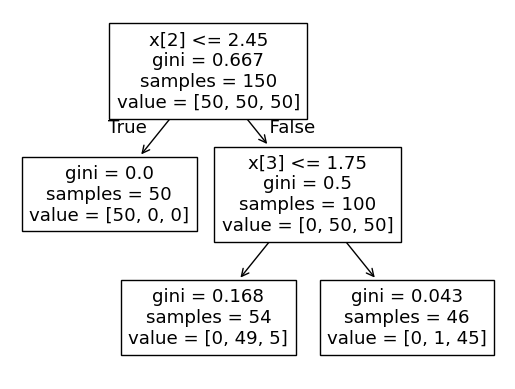

In [ ]:
from sklearn.tree import plot_tree
plot_tree(clas)

# **1.classification**

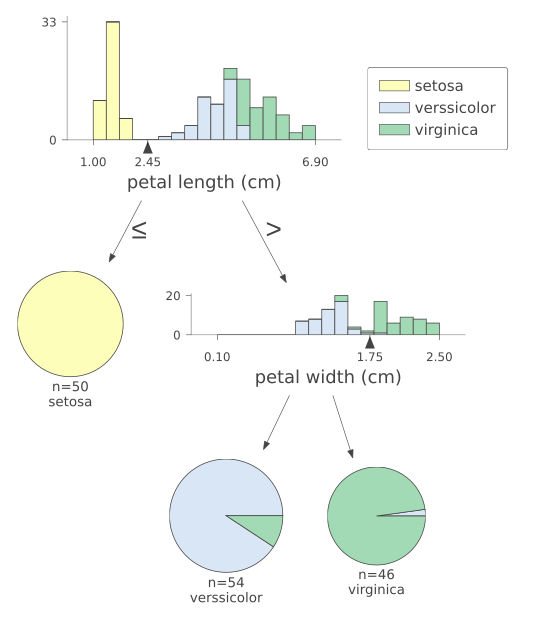

In [14]:
from dtreeviz import model
m = model(clas,X_train,y_train,
          feature_names=iris.feature_names,
    class_names=["setosa","verssicolor","virginica"])
viz = m.view(scale=2)
display(viz)

# **2.Regression**

In [16]:
reg=tree.DecisionTreeRegressor(max_depth=2)
cal=fetch_california_housing()
X_train=cal.data
y_train=cal.target
reg.fit(X_train,y_train)
m = model(reg,X_train,y_train,
          feature_names=cal.feature_names,
    target_name="price")
viz = m.view(scale=2)
display(viz)

# **3.Horizontal Decision Tree**

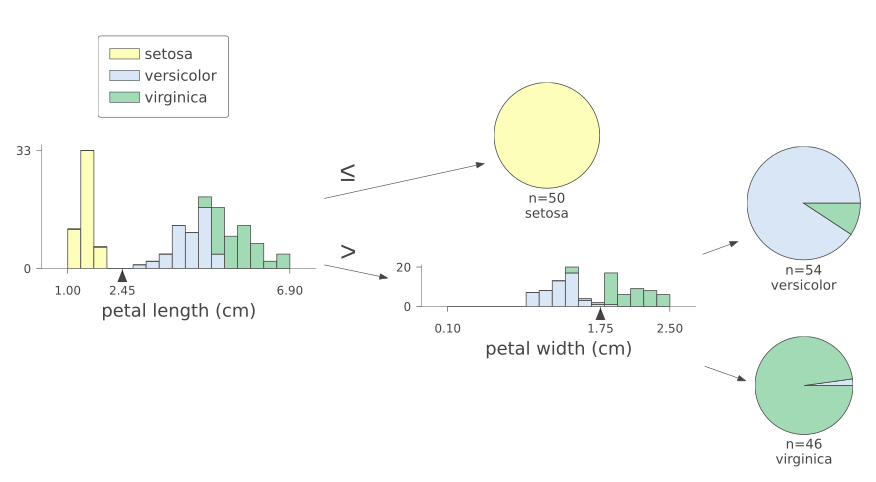

In [18]:
m = model(clas,iris.data,iris.target,
          feature_names=iris.feature_names,
    class_names=iris.target_names)
viz = m.view(scale=2,orientation="LR")
display(viz)

# **4.Show prediction path**

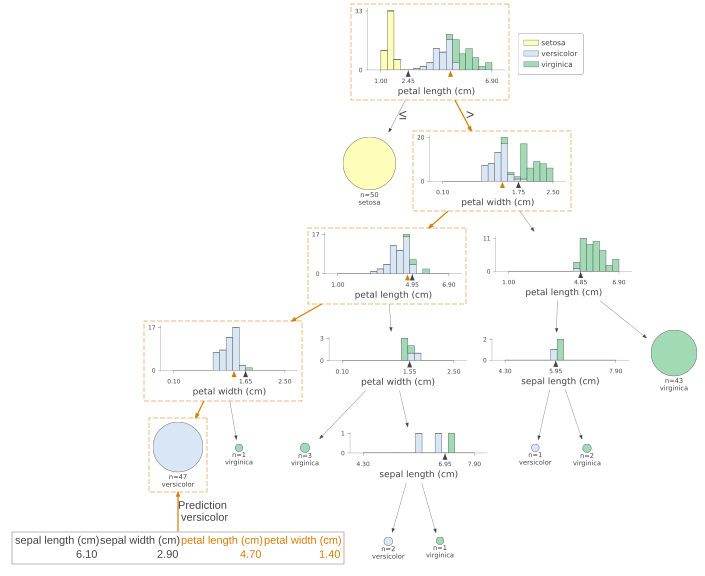

In [29]:
import numpy as np
from dtreeviz import model # Import model from dtreeviz
from sklearn.datasets import load_iris
from sklearn import tree
from IPython.display import display

clas=tree.DecisionTreeClassifier()
iris=load_iris()
X_train=iris.data
y_train=iris.target
clas.fit(X_train,y_train)

# Select a single instance for prediction path
X_instance = iris.data[np.random.randint(0,len(iris.data)),:]

# Create the dtreeviz model object
m = model(clas, X_train, y_train,
          feature_names=iris.feature_names,
          class_names=iris.target_names)

# Call the view method, passing the 1D instance to 'x'
viz = m.view(x=X_instance) # Pass the 1D instance here
display(viz)

# **5.Show node number**

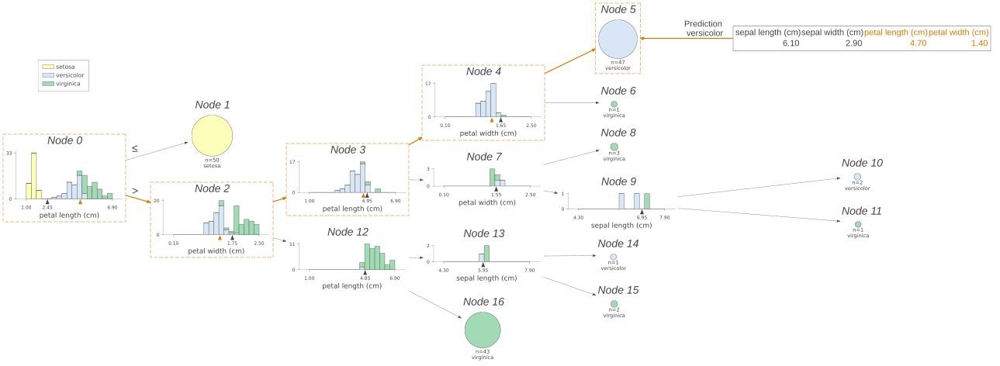

In [30]:
m = model(clas, X_train, y_train,
          feature_names=iris.feature_names,
          class_names=iris.target_names)

# Call the view method, passing the 1D instance to 'x'
viz = m.view(x=X_instance,orientation="LR",histtype="barstacked",show_node_labels=True) # Pass the 1D instance here
display(viz)

# **6.without any graphs**

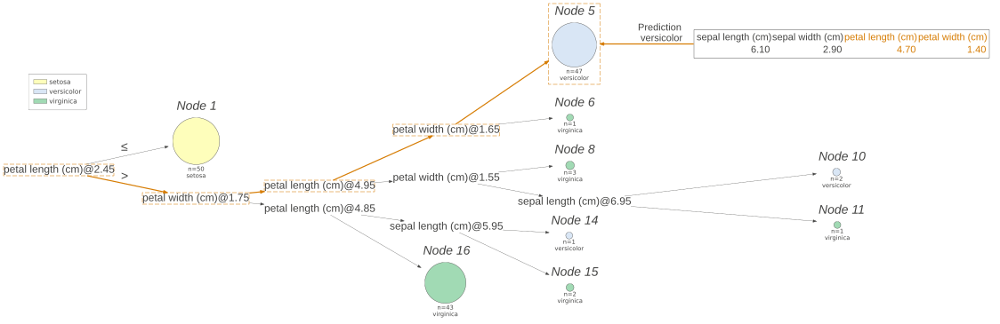

In [31]:
m = model(clas, X_train, y_train,
          feature_names=iris.feature_names,
          class_names=iris.target_names)

# Call the view method, passing the 1D instance to 'x'
viz = m.view(x=X_instance,orientation="LR",histtype="barstacked",show_node_labels=True,fancy=False) # Pass the 1D instance here
display(viz)

# **7.show just prediction path,nothing else**

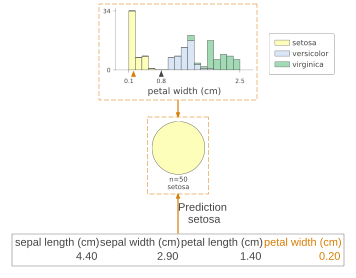

In [32]:
clas=tree.DecisionTreeClassifier()
iris=load_iris()
X_train=iris.data
y_train=iris.target
clas.fit(X_train,y_train)

# Select a single instance for prediction path
X_instance = iris.data[np.random.randint(0,len(iris.data)),:]

# Create the dtreeviz model object
m = model(clas, X_train, y_train,
          feature_names=iris.feature_names,
          class_names=iris.target_names)

# Call the view method, passing the 1D instance to 'x'
viz = m.view(x=X_instance,show_just_path=True) # Pass the 1D instance here
display(viz)

# **8.Prediction path in plain english**

In [37]:
print(m.explain_prediction_path(x=X_instance))

petal width (cm) < 0.8



# **9.feature importance**

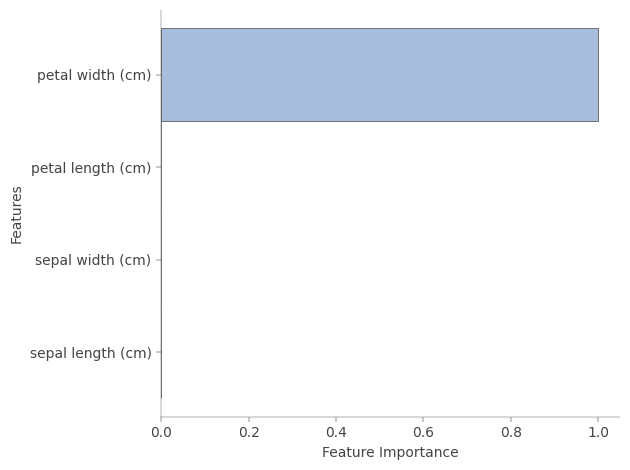

None


In [40]:

from dtreeviz.trees import explain_prediction_sklearn_default
from dtreeviz import model
clas=tree.DecisionTreeClassifier()
iris=load_iris()
X_train=iris.data
y_train=iris.target
clas.fit(X_train,y_train)
m = model(clas,
          X_train,
          y_train,
          target_name='Species',
          class_names=iris.target_names,
          feature_names=iris.feature_names)

print(explain_prediction_sklearn_default(m.shadow_tree, X))

# **10.Univariate Rgression**

In [41]:

import seaborn as sns

# Load the mpg dataset from seaborn
df_cars = sns.load_dataset('mpg')

# Rename columns to match the expected 'WGT', 'ENG', 'MPG'
df_cars = df_cars.rename(columns={'weight': 'WGT', 'horsepower': 'ENG', 'mpg': 'MPG'})

# Drop rows with NaN values if any, as DecisionTreeRegressor does not handle them
df_cars.dropna(inplace=True)

# Display the first few rows to verify
display(df_cars.head())

,MPG,cylinders,displacement,ENG,WGT,acceleration,model_year,origin,name
0,18.0,8,307.0,130.0,3504,12.0,70,usa,chevrolet chevelle malibu
1,15.0,8,350.0,165.0,3693,11.5,70,usa,buick skylark 320
2,18.0,8,318.0,150.0,3436,11.0,70,usa,plymouth satellite
3,16.0,8,304.0,150.0,3433,12.0,70,usa,amc rebel sst
4,17.0,8,302.0,140.0,3449,10.5,70,usa,ford torino


/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but DecisionTreeRegressor was fitted with feature names


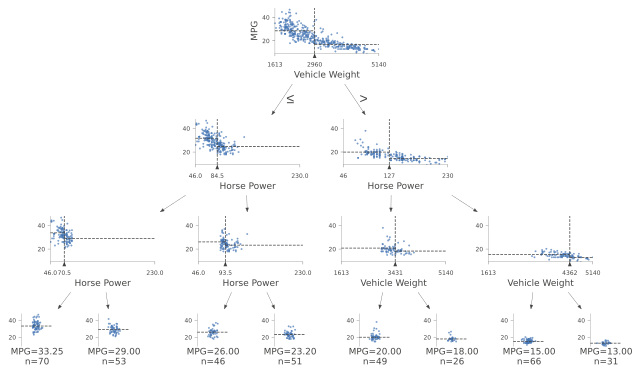

In [48]:
import pandas as pd
import matplotlib.pyplot as plt
from sklearn.tree import DecisionTreeRegressor
from dtreeviz import model # Import model instead of specific viz function

X=df_cars[['WGT','ENG']]
y=df_cars['MPG']
dt=DecisionTreeRegressor(max_depth=3,criterion="absolute_error")
dt.fit(X,y)

m = model(dt, X_train=X, y_train=y, feature_names=['Vehicle Weight','Horse Power'], target_name='MPG')

# Create a figure and an axes object (these lines are now commented out as they are not directly used by m.view())
# fig, ax = plt.subplots(figsize=(12, 8))

v = m.view() # Removed unsupported 'ax' argument

from IPython.display import display
display(v)
# plt.close(fig) # Close the figure to prevent duplicate display in some environments